In [1]:
using Distributions
using QuadGK
using Random
using StatsBase
using StatsPlots
default(fmt=:png, titlefontsize=9)

function sim(dist, n; μ=mean(dist), correction=true, L=10^6)
    D = correction ? TDist(n-1) : Normal()
    pval = Vector{Float64}(undef, L)
    Xtmp = [Vector{Float64}(undef, n) for _ in 1:Threads.nthreads()]
    Threads.@threads for i in 1:L
        tid = Threads.threadid()
        X = Xtmp[tid]
        rand!(dist, X)
        X̄ = mean(X)
        S = std(X)
        T = √n * (X̄ - μ) / S
        pval[i] = 2ccdf(D, abs(T))
    end
    _ecdf_pval = ecdf(pval)
    ecdf_pval(x) = _ecdf_pval(x)
    ecdf_pval
end

function plot_sim(dist, n; μ=mean(dist), correction=true, L=10^6)
    testname = correction ? "t-test" : "no correction"
    distname = replace(string(dist), r"{[^}]*}"=>"")
    ecdf_pval = sim(dist, n; μ, correction, L)
    println("n = $n => coverage probability (α=5%) = ", 1 - ecdf_pval(0.05))
    plot(ecdf_pval, 0, 0.1; label="")
    plot!(identity; label="", c=:grey, ls=:dot)
    plot!(xtick=0:0.01:1, ytick=0:0.01:1, xrotation=30)
    plot!(xguide="nominal significance level α", yguide="probability of P-value ≤ α")
    title!("$testname, $distname, n=$n")
    plot!(size=(400, 420))
end

mydistname(dist) = replace(string(dist), r"{[^}]*}"=>"")

function mydistname(dist::MixtureModel)
    d = mydistname.(dist.components)
    d = replace.(d, r", σ=1.0"=>"")
    p = string.(dist.prior.p)
    name = "$(p[1]) $(d[1])"
    name *= prod(" + $(p[i]) $(d[i])" for i in 2:length(d))
    name
end

function plot_sims(dist; ns=(5, 10, 20, 100), correction=true, L=10^6)
    distname = mydistname(dist)
    println("skewness of $distname = ", skewness(dist))
    println("kurtosis of $distname = ", kurtosis(dist))
    println()
    PP = []
    for n in ns
        P = plot_sim(dist, n; correction, L)
        push!(PP, P)
    end
    println()
    plot(PP...; size=(800, 840))
end

myskewness(dist) = skewness(dist)

function myskewness(dist::MixtureModel)
    μ, σ = mean(dist), std(dist)
    quadgk(x -> pdf(dist, x) * ((x - μ)/σ)^3, extrema(dist)...)[1]
end

mykurtosis(dist) = kurtosis(dist)

function mykurtosis(dist::MixtureModel)
    μ, σ = mean(dist), std(dist)
    quadgk(x -> pdf(dist, x) * ((x - μ)/σ)^4, extrema(dist)...)[1] - 3
end

function plot_sims2(dist; ns=[10; 20:20:200; 300:100:500], L=10^6, α=0.05, kwargs...)
    distname = mydistname(dist)
    println("skewness of $distname = ", myskewness(dist))
    println("kurtosis of $distname = ", mykurtosis(dist))
    println()
    xs = collect(ns)
    println("n ∈ $xs")
    println()
    
    μ, σ = mean(dist), std(dist)
    if σ == Inf
        μ, σ = 0.0, 1.2
    end
    P = plot(x -> pdf(dist, x), μ-5σ, μ+5σ; label="")
    title!(distname)
    plot!(; kwargs...)
    
    prob1 = similar(ns, Float64)
    prob2 = similar(prob1)
    for (i, n) in enumerate(ns)
        ecdf_pval1 = sim(dist, n; correction=true, L)
        prob1[i] = ecdf_pval1(α)
        ecdf_pval2 = sim(dist, n; correction=false, L)
        prob2[i] = ecdf_pval2(α)
    end
    Q = plot(xs, prob1; label="t-test", marker=:o)
    plot!(xs, prob2; label="no correction", ls=:dash, marker=:diamond)
    hline!([α]; label="", ls=:dot, c=:red)
    plot!(xguide="sample size n", yguide="probability of P-values ≤ $α")
    plot!(ytick=0:0.01:1)
    title!(distname)
    
    plot(P, Q; size=(640, 800), layout=(2,1))
end

plot_sims2 (generic function with 1 method)

skewness of Normal(μ=0.0, σ=1.0) = 0.0
kurtosis of Normal(μ=0.0, σ=1.0) = 0.0

n = 5 => coverage probability (α=5%) = 0.878311
n = 10 => coverage probability (α=5%) = 0.918369
n = 20 => coverage probability (α=5%) = 0.934835
n = 100 => coverage probability (α=5%) = 0.946998



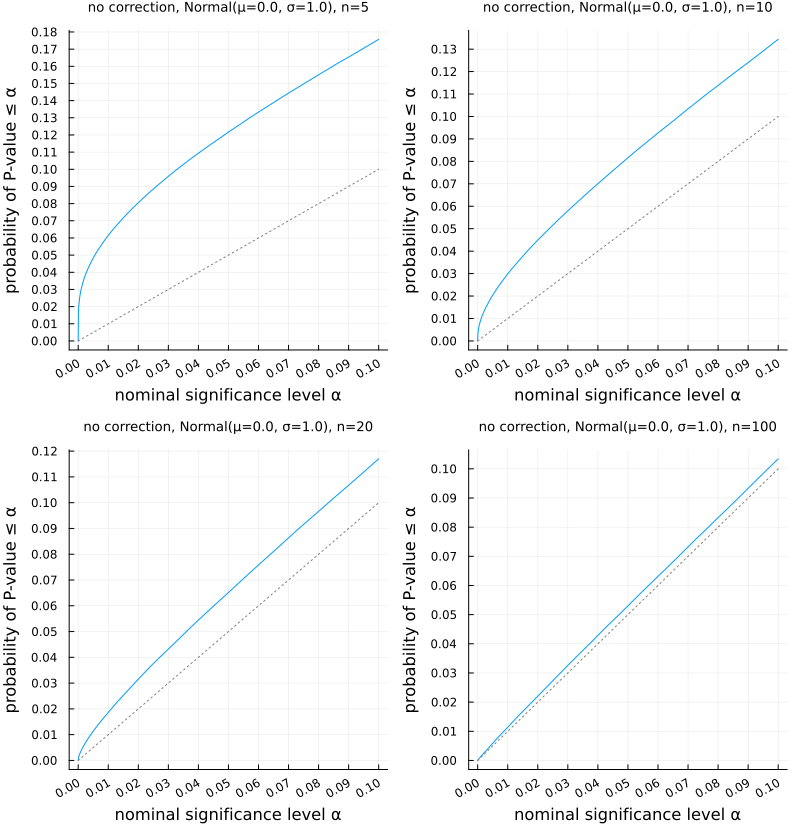

In [2]:
plot_sims(Normal(); ns=(5, 10, 20, 100), correction=false)

skewness of Normal(μ=0.0, σ=1.0) = 0.0
kurtosis of Normal(μ=0.0, σ=1.0) = 0.0

n = 5 => coverage probability (α=5%) = 0.950258
n = 10 => coverage probability (α=5%) = 0.950197
n = 20 => coverage probability (α=5%) = 0.950133
n = 100 => coverage probability (α=5%) = 0.949731



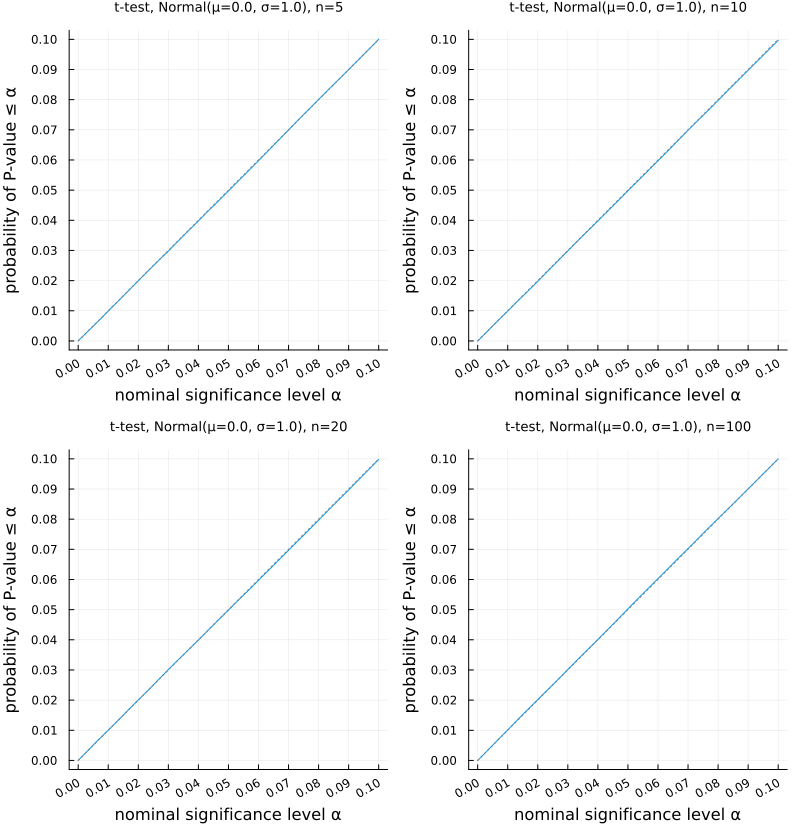

In [3]:
plot_sims(Normal(); ns=(5, 10, 20, 100))

skewness of Uniform(a=0.0, b=1.0) = 0.0
kurtosis of Uniform(a=0.0, b=1.0) = -1.2

n = 5 => coverage probability (α=5%) = 0.870018
n = 10 => coverage probability (α=5%) = 0.916094
n = 20 => coverage probability (α=5%) = 0.93401
n = 100 => coverage probability (α=5%) = 0.946858



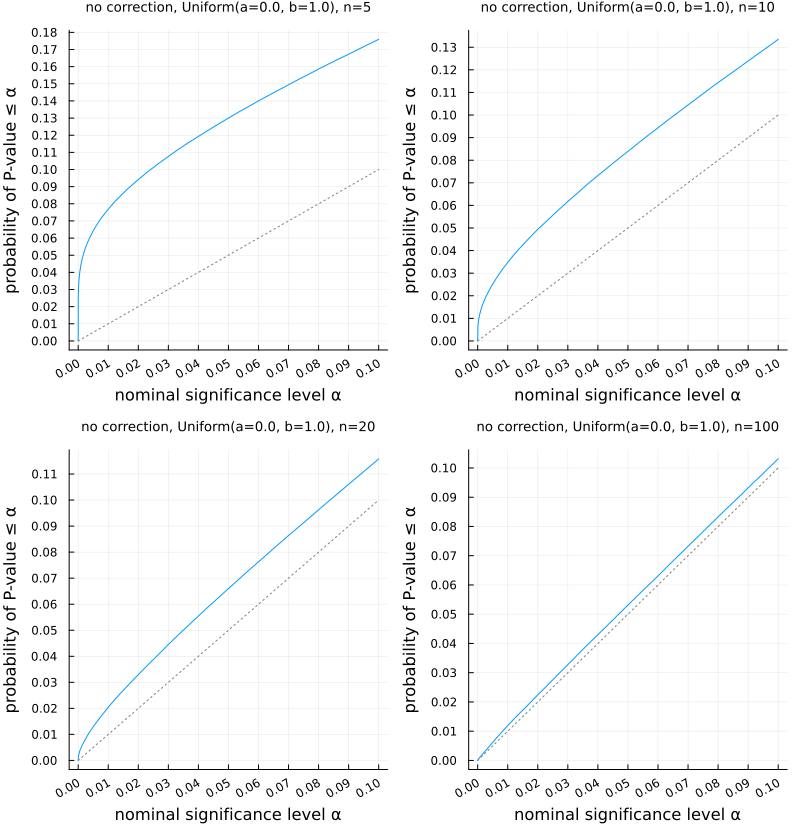

In [4]:
plot_sims(Uniform(); ns=(5, 10, 20, 100), correction=false)

skewness of Uniform(a=0.0, b=1.0) = 0.0
kurtosis of Uniform(a=0.0, b=1.0) = -1.2

n = 5 => coverage probability (α=5%) = 0.933978
n = 10 => coverage probability (α=5%) = 0.946033
n = 20 => coverage probability (α=5%) = 0.948808
n = 100 => coverage probability (α=5%) = 0.950098



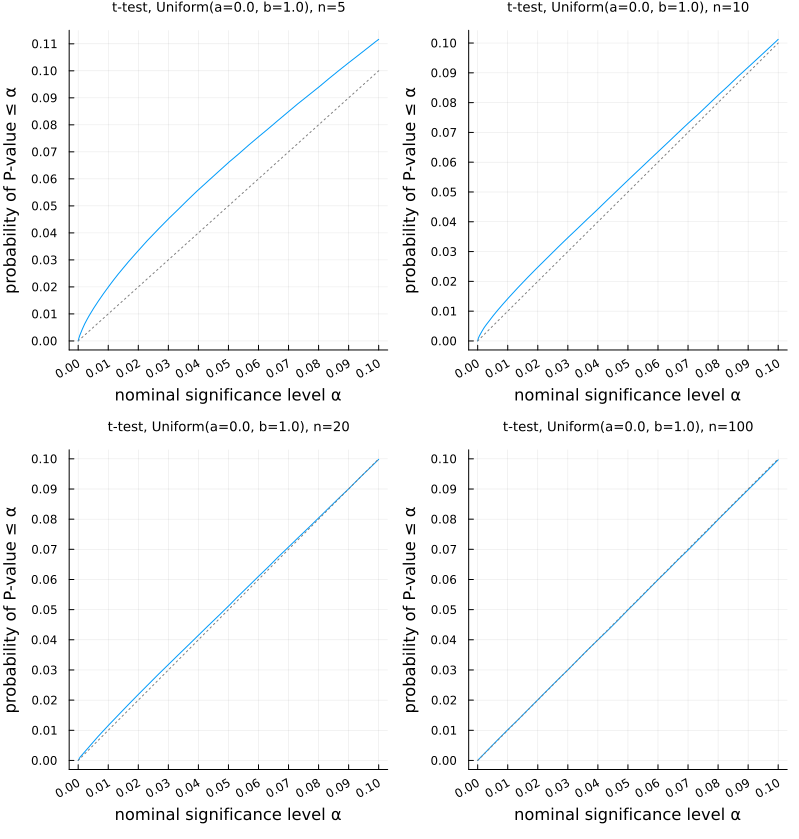

In [5]:
plot_sims(Uniform(); ns=(5, 10, 20, 100))

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n = 5 => coverage probability (α=5%) = 0.81132
n = 10 => coverage probability (α=5%) = 0.869915
n = 20 => coverage probability (α=5%) = 0.904586
n = 100 => coverage probability (α=5%) = 0.93912



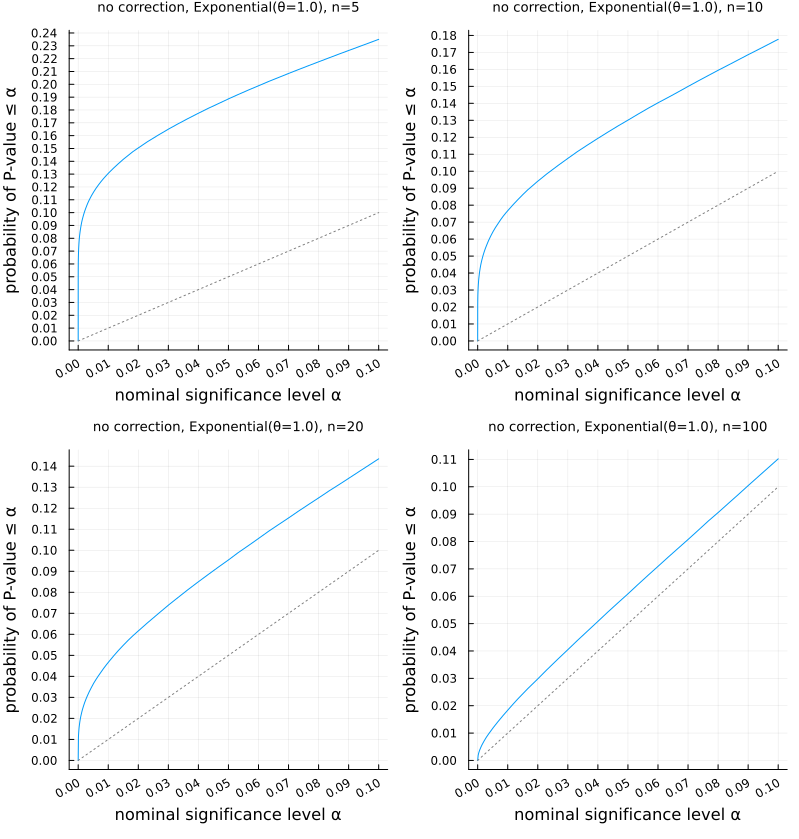

In [6]:
plot_sims(Exponential(); ns=(5, 10, 20, 100), correction=false)

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n = 5 => coverage probability (α=5%) = 0.883175
n = 10 => coverage probability (α=5%) = 0.900708
n = 20 => coverage probability (α=5%) = 0.9183790000000001
n = 100 => coverage probability (α=5%) = 0.941755



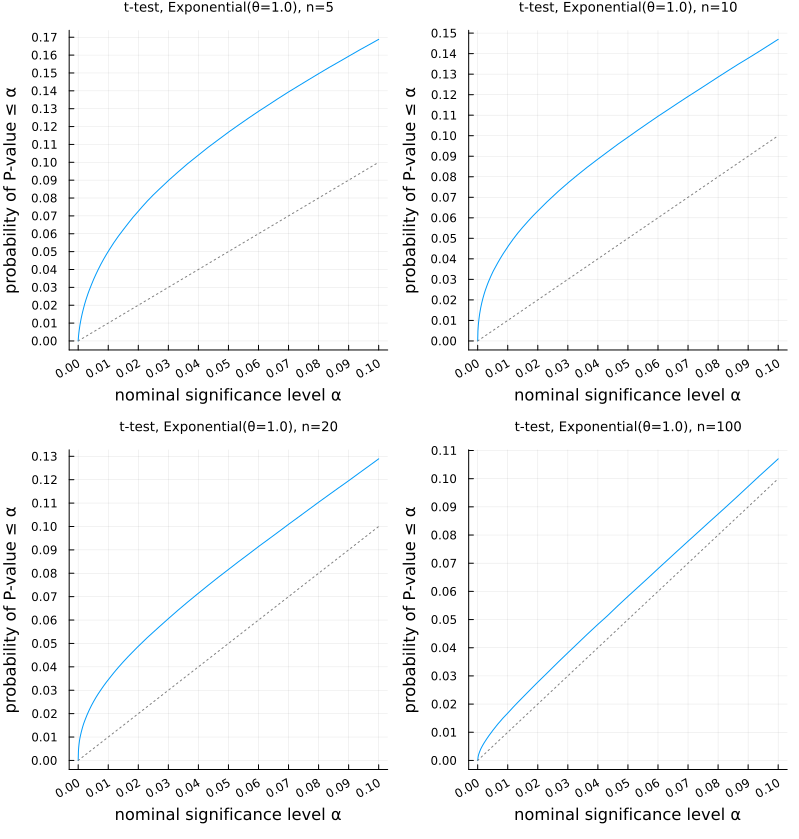

In [7]:
plot_sims(Exponential(); ns=(5, 10, 20, 100))

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n = 100 => coverage probability (α=5%) = 0.941854
n = 200 => coverage probability (α=5%) = 0.945853
n = 500 => coverage probability (α=5%) = 0.948038
n = 1000 => coverage probability (α=5%) = 0.948821



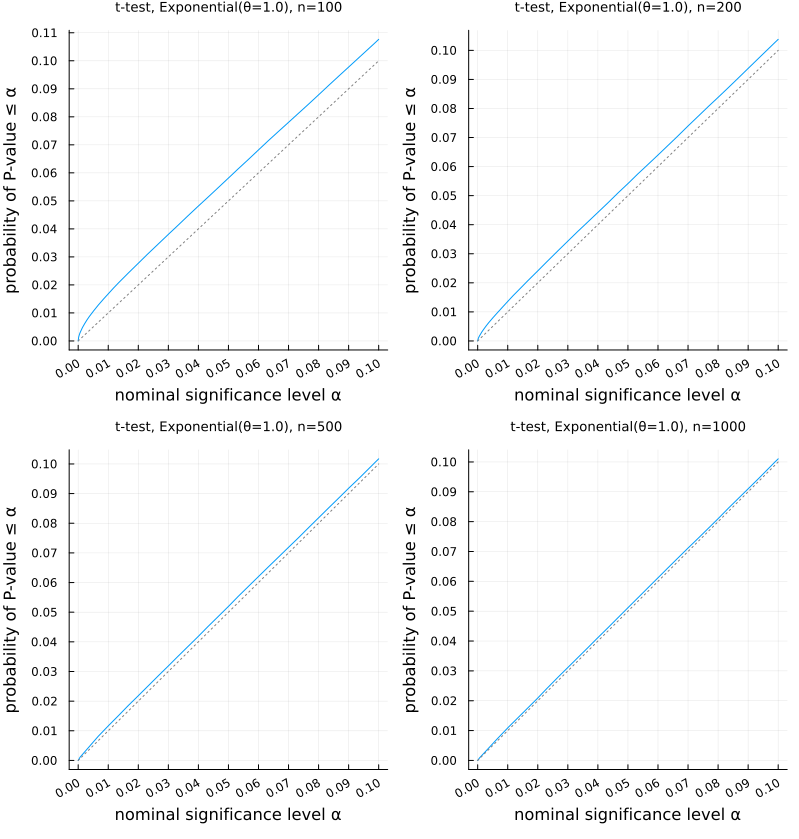

In [8]:
plot_sims(Exponential(); ns=(100, 200, 500, 1000))

skewness of Beta(α=0.1, β=0.1) = 0.0
kurtosis of Beta(α=0.1, β=0.1) = -1.875

n = 5 => coverage probability (α=5%) = 0.90217
n = 10 => coverage probability (α=5%) = 0.910119
n = 20 => coverage probability (α=5%) = 0.933853
n = 100 => coverage probability (α=5%) = 0.947035



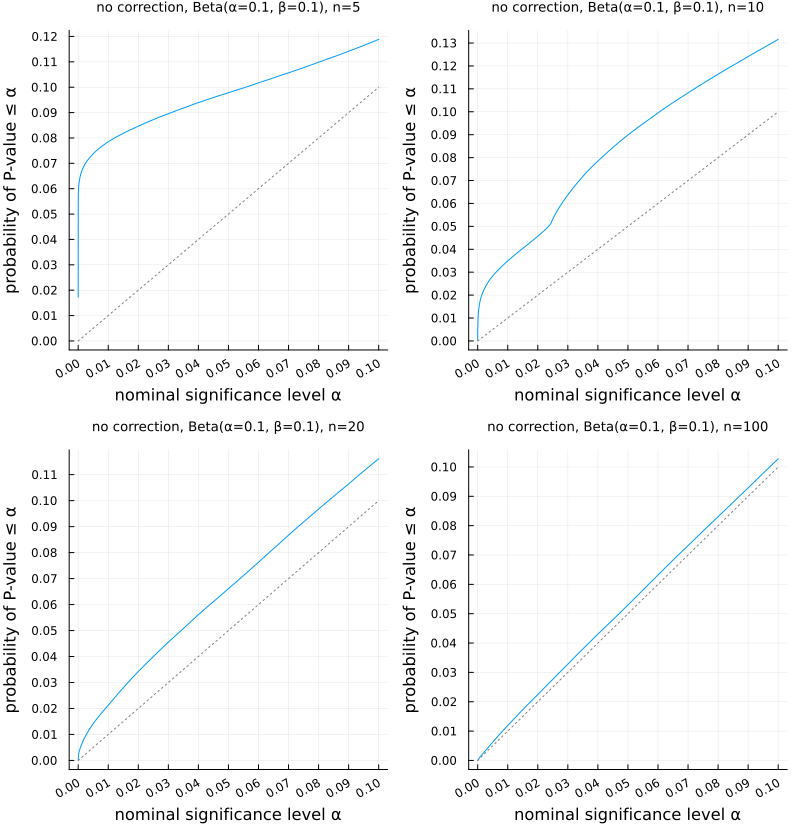

In [9]:
plot_sims(Beta(0.1, 0.1); ns=(5, 10, 20, 100), correction=false)

skewness of Beta(α=0.1, β=0.1) = 0.0
kurtosis of Beta(α=0.1, β=0.1) = -1.875

n = 5 => coverage probability (α=5%) = 0.925287
n = 10 => coverage probability (α=5%) = 0.950311
n = 20 => coverage probability (α=5%) = 0.94786
n = 100 => coverage probability (α=5%) = 0.949953



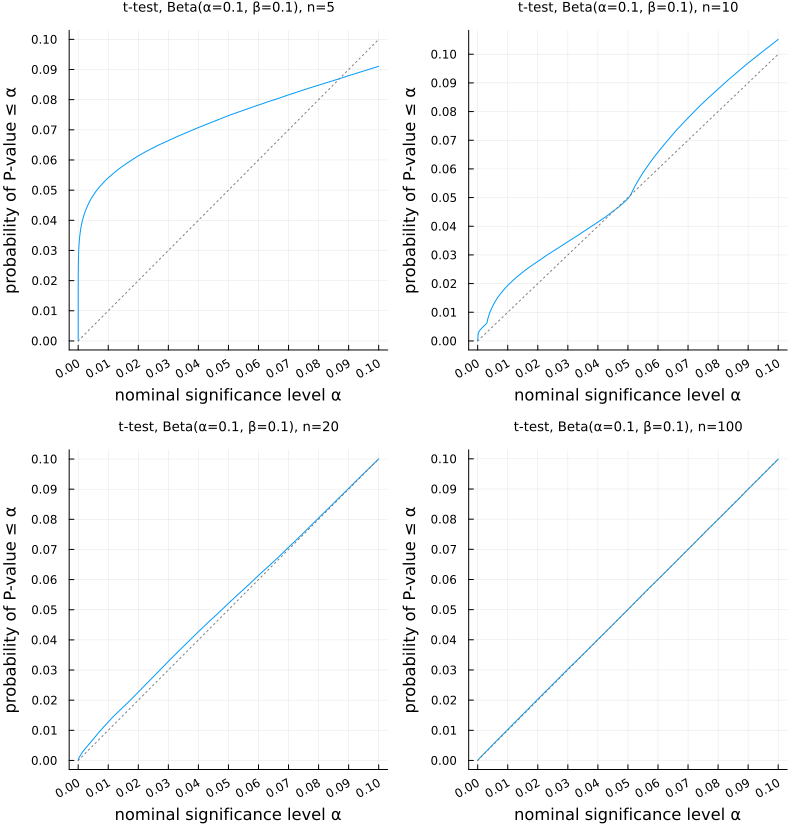

In [10]:
plot_sims(Beta(0.1, 0.1); ns=(5, 10, 20, 100))

skewness of TDist(ν=4.0) = 0.0
kurtosis of TDist(ν=4.0) = Inf

n = 5 => coverage probability (α=5%) = 0.889544
n = 10 => coverage probability (α=5%) = 0.925437
n = 20 => coverage probability (α=5%) = 0.938936
n = 100 => coverage probability (α=5%) = 0.948582



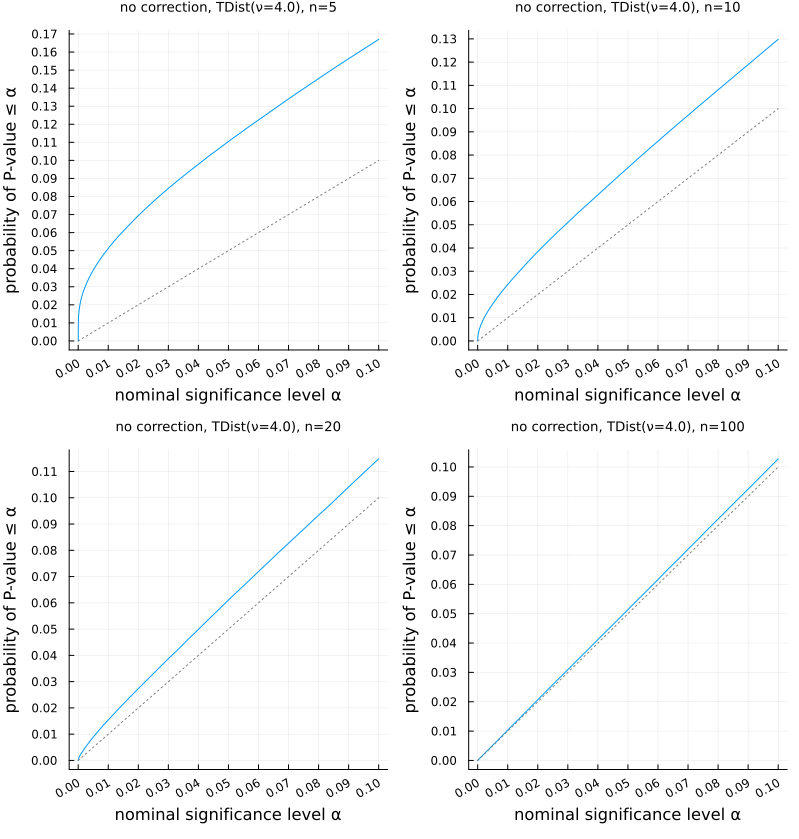

In [11]:
plot_sims(TDist(4); ns=(5, 10, 20, 100), correction=false)

skewness of TDist(ν=4.0) = 0.0
kurtosis of TDist(ν=4.0) = Inf

n = 5 => coverage probability (α=5%) = 0.959295
n = 10 => coverage probability (α=5%) = 0.956977
n = 20 => coverage probability (α=5%) = 0.95411
n = 100 => coverage probability (α=5%) = 0.951287



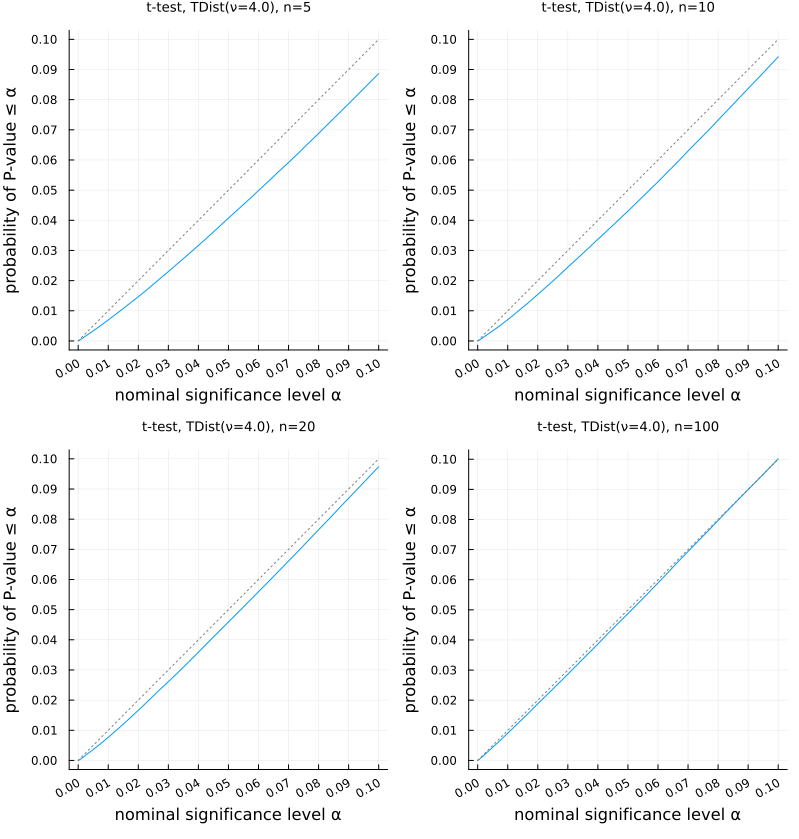

In [12]:
plot_sims(TDist(4); ns=(5, 10, 20, 100))

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 5 => coverage probability (α=5%) = 0.7432030000000001
n = 10 => coverage probability (α=5%) = 0.8065869999999999
n = 20 => coverage probability (α=5%) = 0.851747
n = 100 => coverage probability (α=5%) = 0.914539



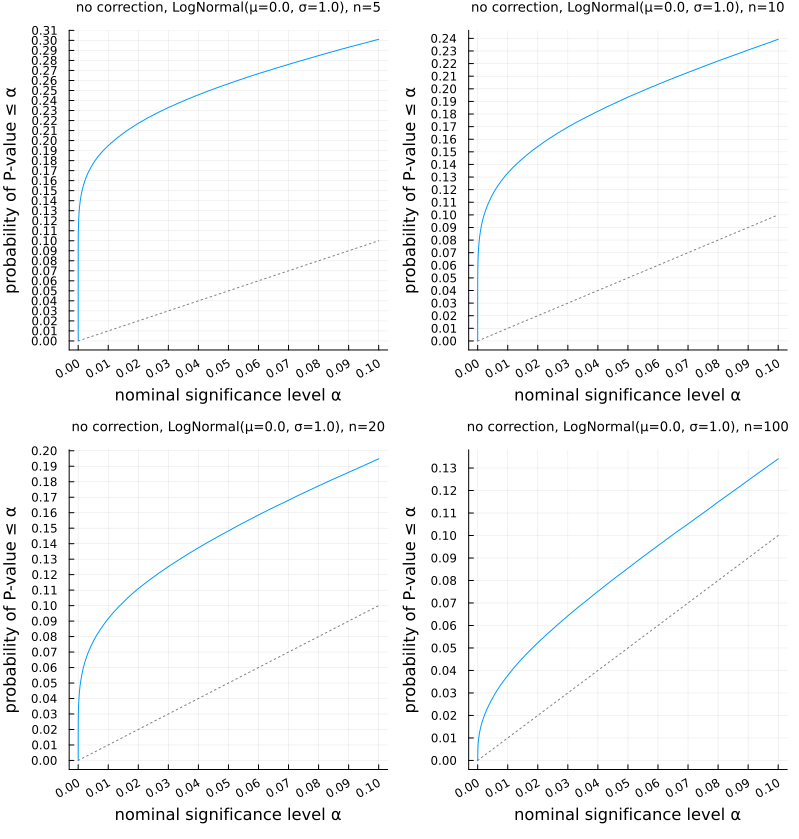

In [13]:
plot_sims(LogNormal(); ns=(5, 10, 20, 100), correction=false)

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 5 => coverage probability (α=5%) = 0.8207139999999999
n = 10 => coverage probability (α=5%) = 0.838829
n = 20 => coverage probability (α=5%) = 0.8669020000000001
n = 100 => coverage probability (α=5%) = 0.916684



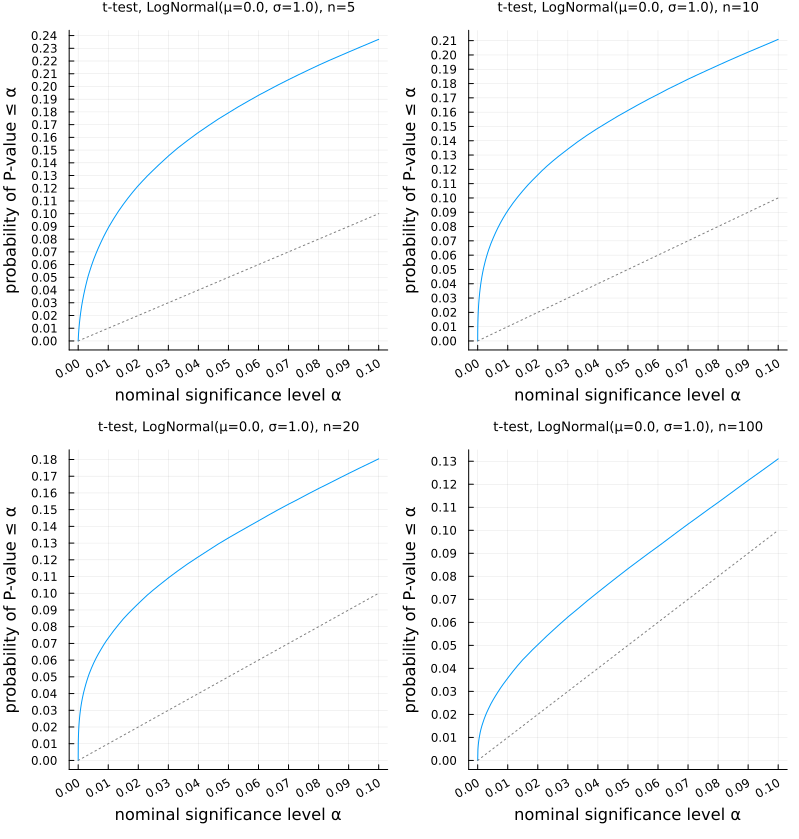

In [14]:
plot_sims(LogNormal(); ns=(5, 10, 20, 100))

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 100 => coverage probability (α=5%) = 0.914535
n = 300 => coverage probability (α=5%) = 0.9342
n = 1000 => coverage probability (α=5%) = 0.943771
n = 3000 => coverage probability (α=5%) = 0.947406



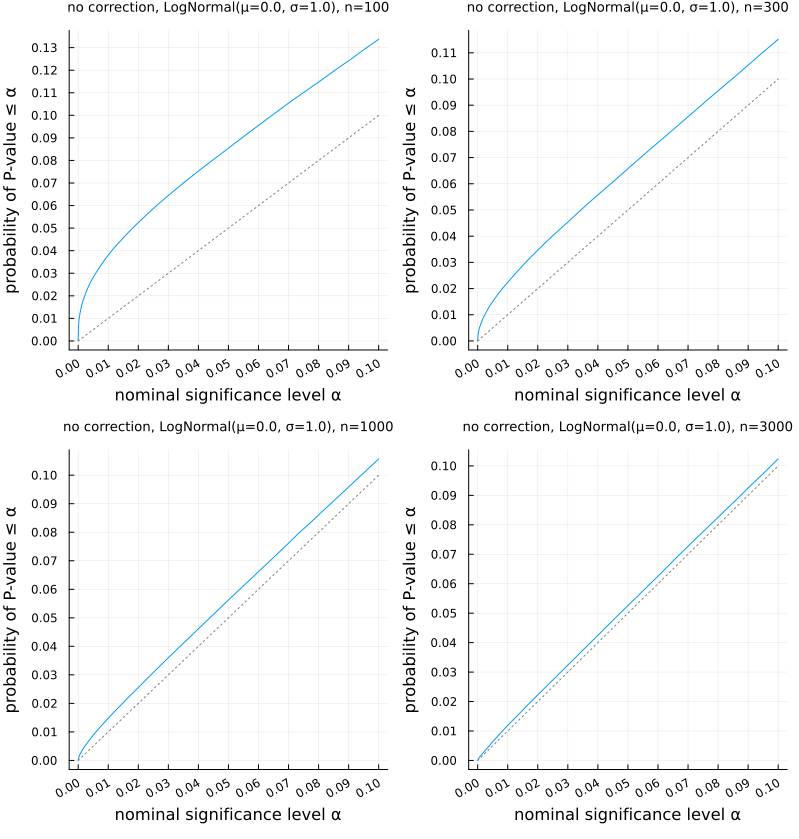

In [15]:
plot_sims(LogNormal(); ns=(100, 300, 1000, 3000), correction=false)

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 100 => coverage probability (α=5%) = 0.916754
n = 300 => coverage probability (α=5%) = 0.934886
n = 1000 => coverage probability (α=5%) = 0.94394
n = 3000 => coverage probability (α=5%) = 0.947934



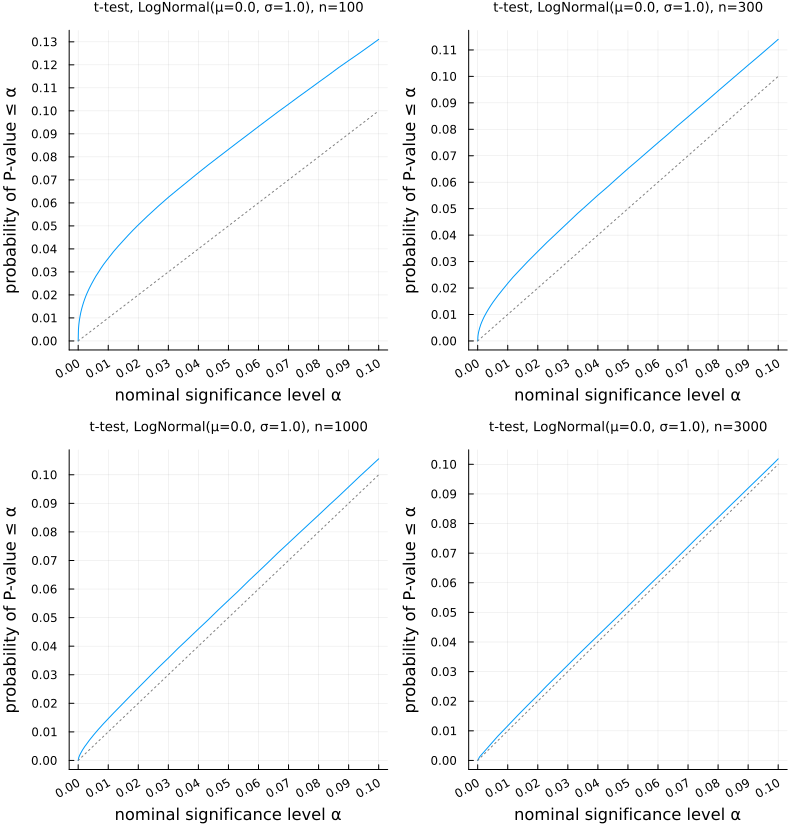

In [16]:
plot_sims(LogNormal(); ns=(100, 300, 1000, 3000))

skewness of Normal(μ=0.0, σ=1.0) = 0.0
kurtosis of Normal(μ=0.0, σ=1.0) = 0.0

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



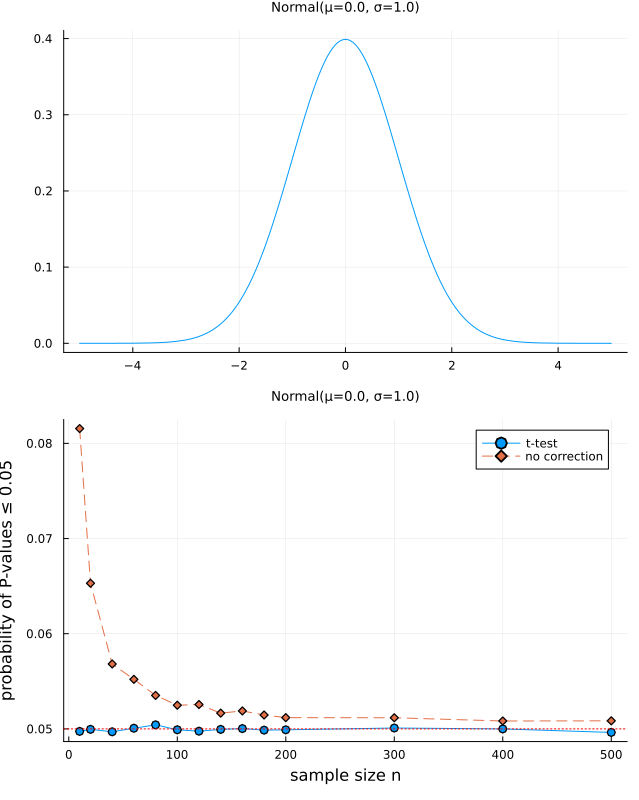

In [17]:
plot_sims2(Normal())

skewness of Uniform(a=0.0, b=1.0) = 0.0
kurtosis of Uniform(a=0.0, b=1.0) = -1.2

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



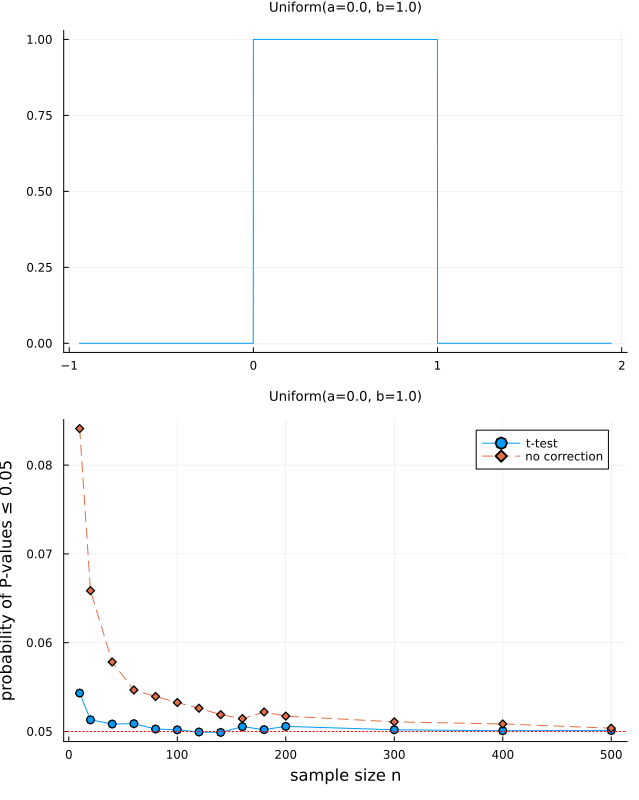

In [18]:
plot_sims2(Uniform())

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n ∈ [20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 250, 500, 750, 1000]



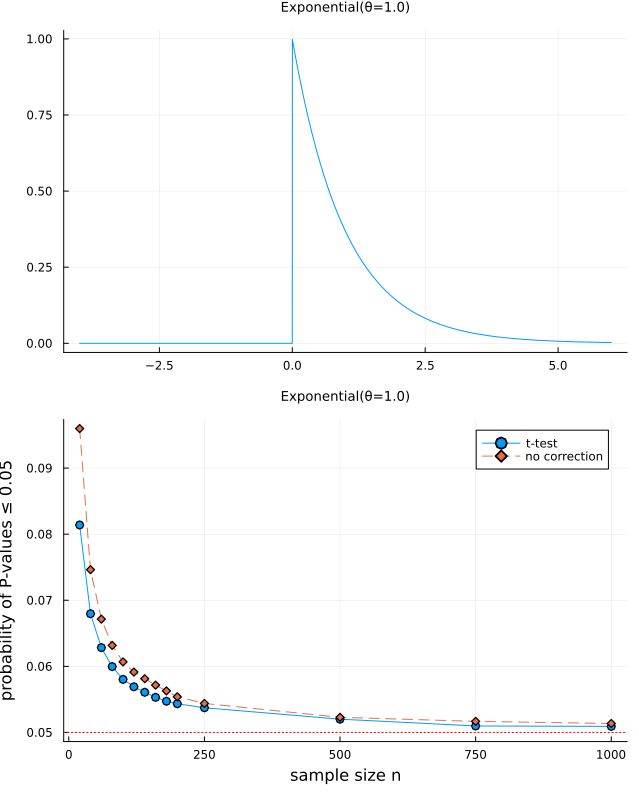

In [19]:
plot_sims2(Exponential(); ns=[20:20:200; 250; 500; 750; 1000])

skewness of Beta(α=0.1, β=0.1) = 0.0
kurtosis of Beta(α=0.1, β=0.1) = -1.875

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



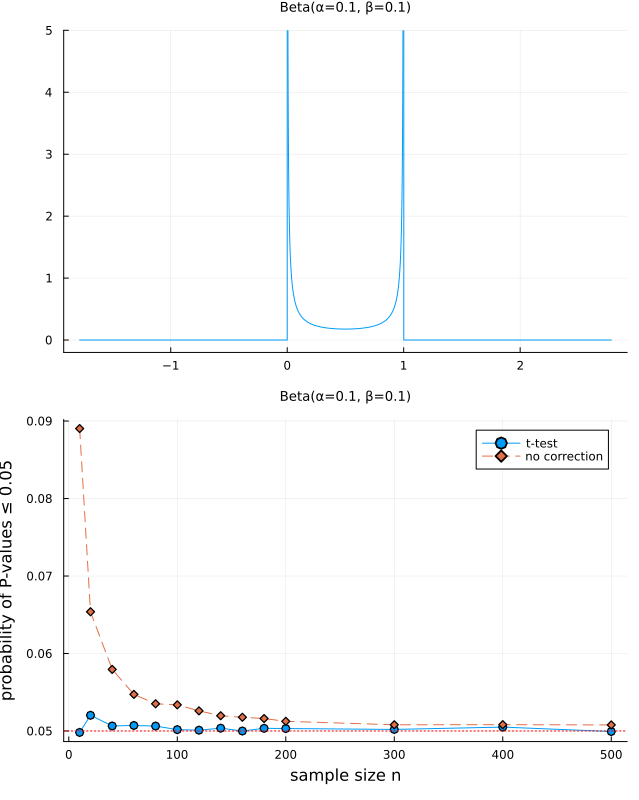

In [20]:
plot_sims2(Beta(0.1, 0.1); ylim=(-0.2, 5))

skewness of TDist(ν=5.0) = 0.0
kurtosis of TDist(ν=5.0) = 6.0

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



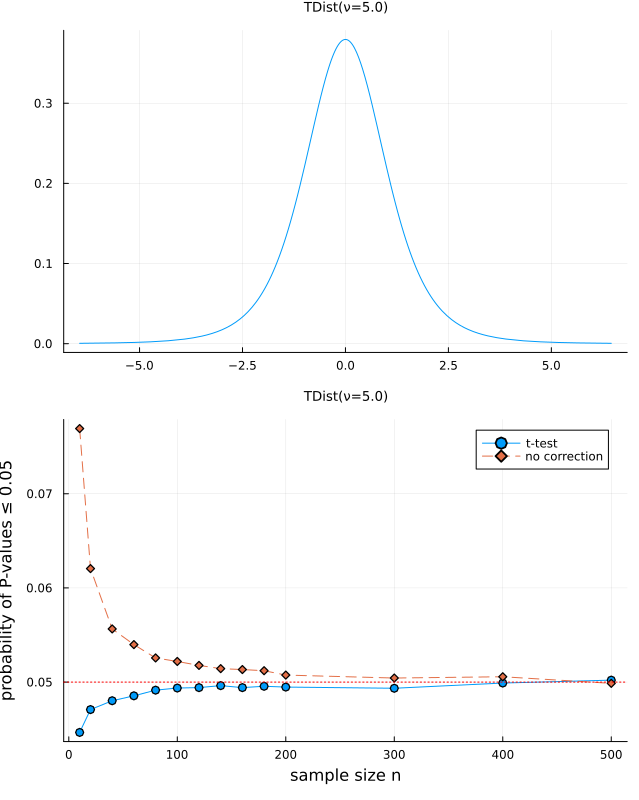

In [21]:
plot_sims2(TDist(5))

skewness of TDist(ν=4.0) = 0.0
kurtosis of TDist(ν=4.0) = Inf

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



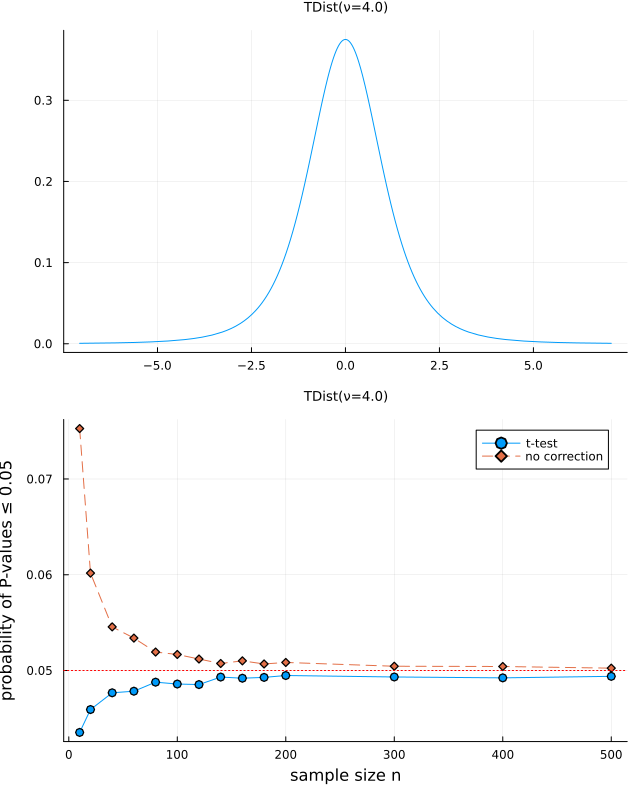

In [22]:
plot_sims2(TDist(4))

skewness of TDist(ν=3.0) = NaN
kurtosis of TDist(ν=3.0) = Inf

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



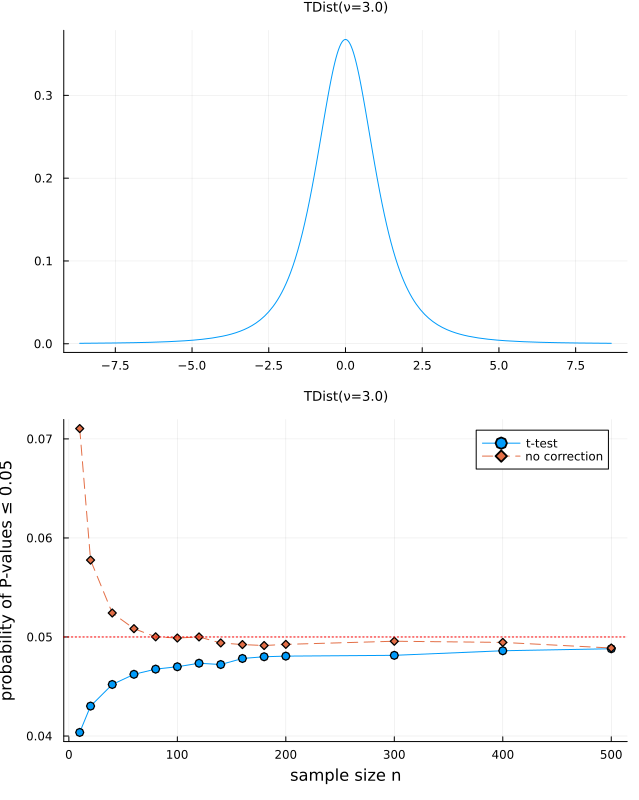

In [23]:
plot_sims2(TDist(3))

skewness of TDist(ν=2.0) = NaN
kurtosis of TDist(ν=2.0) = NaN

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



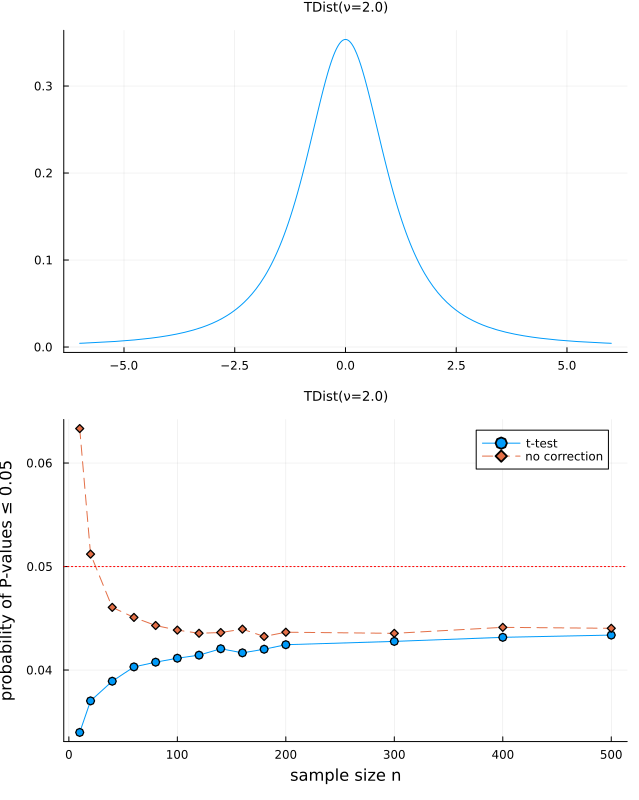

In [24]:
plot_sims2(TDist(2))

skewness of TDist(ν=1.1) = NaN
kurtosis of TDist(ν=1.1) = NaN

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



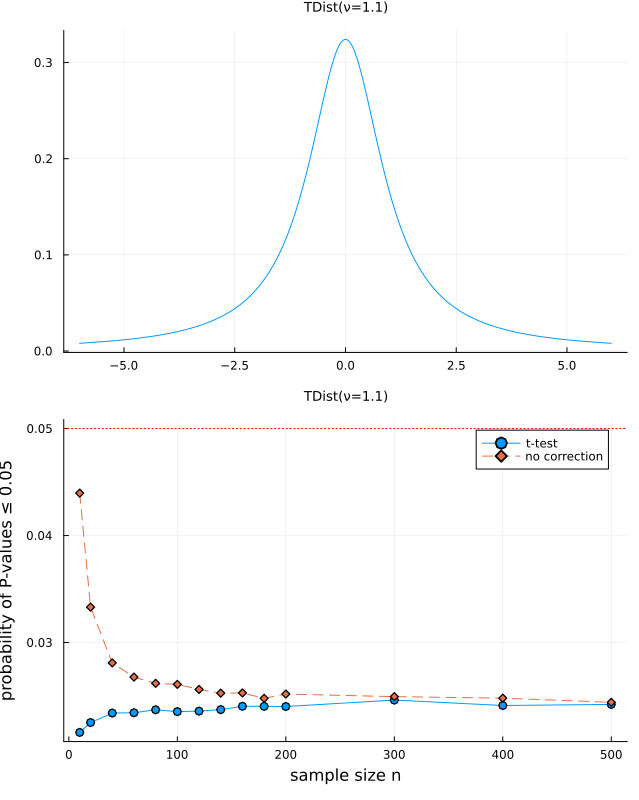

In [25]:
plot_sims2(TDist(1.1))

skewness of Gamma(α=2.0, θ=3.0) = 1.414213562373095
kurtosis of Gamma(α=2.0, θ=3.0) = 3.0

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



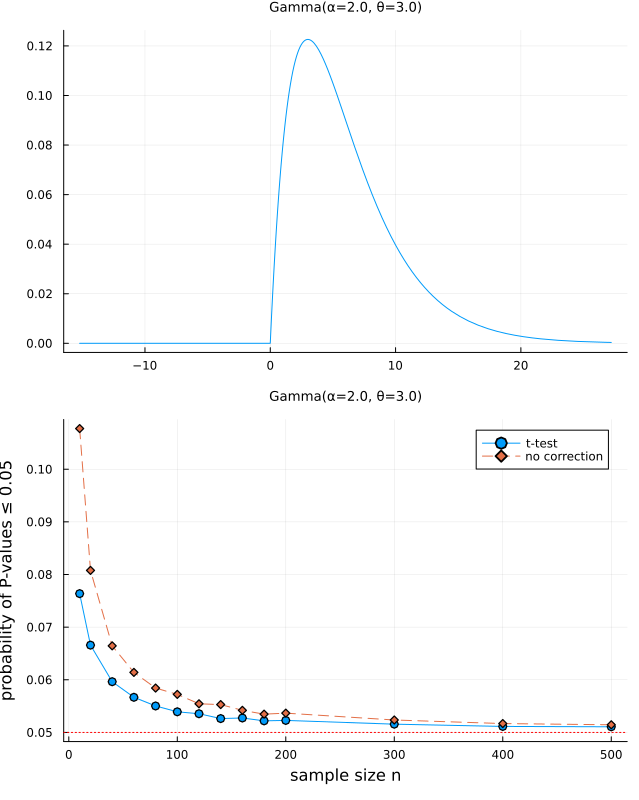

In [26]:
plot_sims2(Gamma(2, 3))

skewness of 0.7 Normal(μ=0.0, σ=1.5) + 0.3 Normal(μ=2.5) = -0.11531718339054184
kurtosis of 0.7 Normal(μ=0.0, σ=1.5) + 0.3 Normal(μ=2.5) = -0.5005767012693063

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



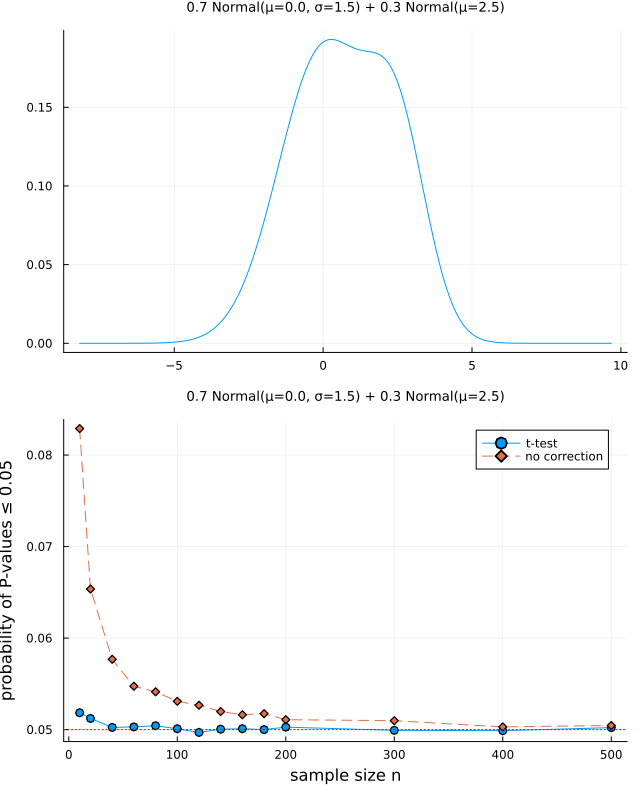

In [27]:
mixnormal = MixtureModel([Normal(0, 1.5), Normal(2.5)], [0.7, 0.3])
plot_sims2(mixnormal)

skewness of 0.7 Normal(μ=0.0, σ=1.5) + 0.3 Normal(μ=5.0) = 0.34505793058272954
kurtosis of 0.7 Normal(μ=0.0, σ=1.5) + 0.3 Normal(μ=5.0) = -0.963065558633426

n ∈ [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300, 400, 500]



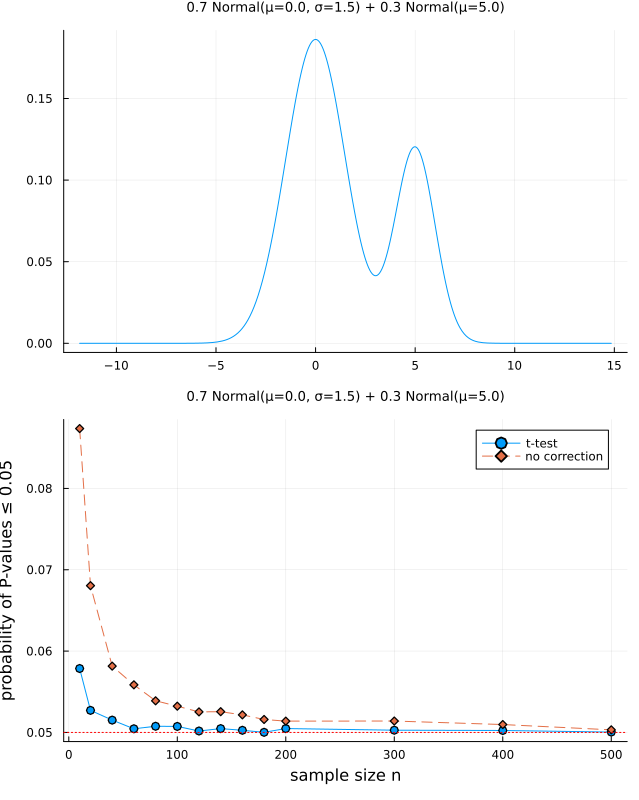

In [28]:
mixnormal = MixtureModel([Normal(0, 1.5), Normal(5)], [0.7, 0.3])
plot_sims2(mixnormal)

skewness of 0.9 Normal(μ=0.0) + 0.1 Normal(μ=10.0) = 2.2768399153275736
kurtosis of 0.9 Normal(μ=0.0) + 0.1 Normal(μ=10.0) = 4.140000000000016

n ∈ [20, 40, 60, 80, 100, 150, 200, 250, 500, 750, 1000]



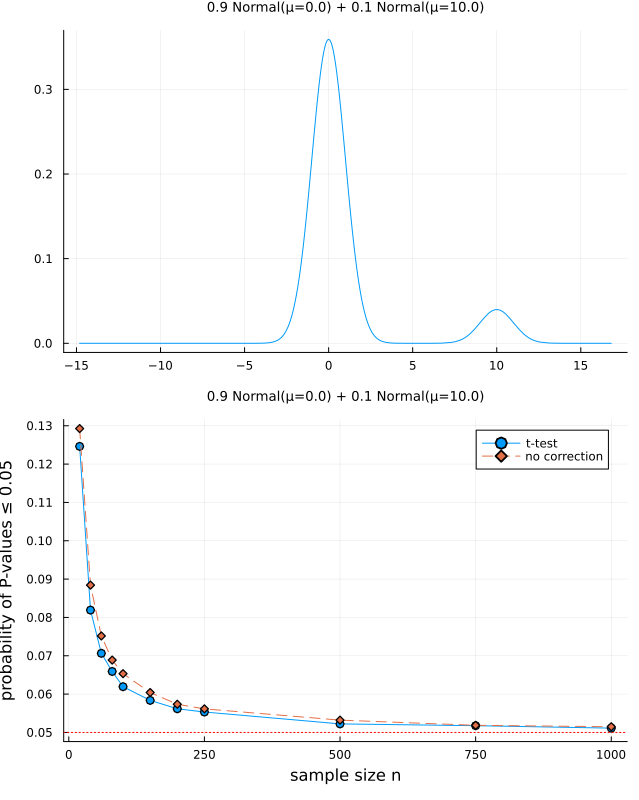

In [29]:
mixnormal = MixtureModel([Normal(), Normal(10)], [0.9, 0.1])
plot_sims2(mixnormal; ns=[20:20:100; 150:50:250; 500; 750; 1000])